In [ ]:
import shutil
import os
import requests
from tqdm import tqdm
from bs4 import BeautifulSoup as bs
from urllib.parse import urljoin, urlparse
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from shutil import copyfile
import cv2
import glob
# создадим датасет
# скачаем несколько цветных глав и чёрно-белых


path_color = "manga/color/"
path_gray = "manga/gray/"
os.mkdir("manga")
os.mkdir("manga/color")
os.mkdir("manga/gray")
os.mkdir("filtred")
os.mkdir("filtred/color")
os.mkdir("filtred/gray")

photo_name = 'x*.jpg'
chapter_gray = 'https://readjojolion.com/manga/jojolion-chapter-*/'
chapter_color = 'https://jojomanga.com/manga/jojos-bizarre-adventure-part-8-jojolion-chapter-*/'
#обработаем апросы

# url картинок и максимальное число страниц
soup = bs(requests.get('https://readjojolion.com/manga/jojolion-chapter-*/').content, 'html.parser')
soup.find_all("img")

r = requests.get('https://ws2374hpbwbyj.z8q9ykvmh8b4r.mangadex.network/qsUanEWeEzztI-oO03xVJSTzoGJki3RB3yIyAJS4d6askXJuGDA9yq-WOJHhQu803mZ5Dlkb23hw1UCLjPKO1z_YNfYDjkNTzBMAlvB12xktVjpGmyaAUhKmpDqav2k5Akm0oJ5ISjVd1HvHcOmGRoap6oqOw428jA9K-y30CMjwhT-PizKFgnqwLLQ9DcS281wmxsIDUHg8RsLzXt5xUKWOay2D/data/c148049acde504a69d630f08baca1987/x3.jpg')
with open('new_image.png', 'wb') as f:
  f.write(r.content)

In [ ]:
# функция загружает изображения манги
from os import path
import os.path

def download_images(chapter_template, save_path):
  for chapter_num in tqdm(range(1, 33), "Chapters upload"):
    chapter_url = chapter_template.replace('*', str(chapter_num))
    soup = bs(requests.get(chapter_url).content, 'html.parser')
    chapter_dir_name = save_path + str(chapter_num) + '/' 
    
    if not path.exists(chapter_dir_name):
      os.mkdir(chapter_dir_name)
    # кол-во изображений
    total_img = 0
    for idx, img in enumerate(soup.find_all("img")):
      img_url = img.attrs.get("src")
      if img_url[4] == 's' and img_url[-4] == '.' and len(img_url) >= 90:
        img_download = requests.get(img_url)
        img_path = chapter_dir_name + str(idx) + '.jpg'#str(chapter_num) + '/' + str(idx)
        with open(img_path, 'wb') as f:
          f.write(img_download.content)
          total_img = idx
    print(f'Chapter {chapter_num} downloaded {total_img} images')

#download_images(chapter_gray, path_gray)
download_images(chapter_color, path_color)

In [ ]:
# создание датасета
start = 1
color_path = '/content/filtred/color/*.jpg'
gray_path = '/content/filtred/gray/*.jpg'
for chapter in range(1, 30):
  chapter_path_color = '/content/manga/color/chapter/*.jpg'.replace('chapter', str(chapter))
  chapter_path_gray = '/content/manga/gray/chapter/*.jpg'.replace('chapter', str(chapter))
  for filepath in glob.iglob(chapter_path_color):
    color_image = cv2.imread(filepath)
    if color_image.shape == (1400, 886, 3):
      gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)
      temp_path_color = color_path.replace('*', str(start))
      temp_path_gray = gray_path.replace('*', str(start))
      cv2.imwrite(temp_path_gray, gray_image)
      gray_image = cv2.imread(temp_path_gray)
      concat_image = cv2.hconcat([gray_image, color_image])
      resize = cv2.resize(concat_image, (3544, 1772), interpolation=cv2.INTER_AREA)
      cv2.imwrite(temp_path_color, resize)
      start += 1

In [ ]:
# валидация
os.mkdir("val")
os.mkdir("val/color")
os.mkdir("val/gray")
start = 1
color_path = '/content/val/color/*.jpg'
gray_path = '/content/val/gray/*.jpg'
for chapter in range(30, 33):
  chapter_path_color = '/content/manga/color/chapter/*.jpg'.replace('chapter', str(chapter))
  chapter_path_gray = '/content/manga/gray/chapter/*.jpg'.replace('chapter', str(chapter))
  for filepath in glob.iglob(chapter_path_color):
    color_image = cv2.imread(filepath)
    if color_image.shape == (1400, 886, 3):
      gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)
      temp_path_color = color_path.replace('*', str(start))
      temp_path_gray = gray_path.replace('*', str(start))
      cv2.imwrite(temp_path_gray, gray_image)
      gray_image = cv2.imread(temp_path_gray)
      concat_image = cv2.hconcat([gray_image, color_image])
      resize = cv2.resize(concat_image, (3544, 1772), interpolation=cv2.INTER_AREA)
      cv2.imwrite(temp_path_color, resize)
      start += 1

In [ ]:
!pip install torch_snippets pytorch_model_summary

In [ ]:
from torch_snippets import *
from pytorch_model_summary import summary
from torchvision import transforms
from PIL import Image

device = 'cuda' if torch.cuda.is_available() else 'cpu'
logger.info(f'USING DEVICE: {device}')

IMAGE_SIZE = 512
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# подготовка данных
class Pix2PixDataset(Dataset):
    def __init__(self, root):
        self.files = Glob(root, silent=True)
        logger.info(f'Loaded {len(self)} files')
    def __getitem__(self, ix):
        img = cv2.imread(self.files[randint(len(self))])[...,::-1]
        h, w, _ = img.shape
        img_src = Image.fromarray(img[:,:w//2])
        img_trg = Image.fromarray(img[:,w//2:])
        return img_src, img_trg

    def __len__(self): 
      return min(10000, len(self.files))

    def choose(self): 
      return self[randint(len(self))]

    def collate_fn(self, batch):
        srcs, trgs = list(zip(*batch))
        srcs = torch.cat([transform(img)[None] for img in srcs], 0).to(device).float()
        trgs = torch.cat([transform(img)[None] for img in trgs], 0).to(device).float()
        return srcs.to(device), trgs.to(device)

trn_ds = Pix2PixDataset('/content/filtred/color')
val_ds = Pix2PixDataset('/content/val/color')

trn_dl = DataLoader(trn_ds, batch_size=4, shuffle=True, collate_fn=trn_ds.collate_fn)


2021-01-31 18:37:36.238 | INFO     | __main__:<module>:7 - USING DEVICE: cuda
2021-01-31 18:37:36.242 | INFO     | __main__:__init__:19 - Loaded 509 files
2021-01-31 18:37:36.243 | INFO     | __main__:__init__:19 - Loaded 105 files


In [ ]:
# инициализация весов нормальным распределением
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

In [ ]:
# кодирующий блок UNet
class UNetEncoder(nn.Module):
    def __init__(self, in_chan, out, normalize=True, dropout=0.0):
        super(UNetEncoder, self).__init__()
        block = [nn.Conv2d(in_chan, out, 4, 2, 1, bias=False)]
        if normalize:
            block.append(nn.InstanceNorm2d(out))
        block.append(nn.LeakyReLU(0.2))
        if dropout:
            block.append(nn.Dropout(dropout))
        self.encode = nn.Sequential(*block)

    def forward(self, x):
        return self.encode(x)

In [ ]:
# декодирующий блок UNet
class UNetDecoder(nn.Module):
    def __init__(self, in_chan, out, normalize=True, dropout=0.0):
        super(UNetDecoder, self).__init__()
        block = [
            nn.ConvTranspose2d(in_chan, out, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(out),
            nn.ReLU(inplace=True),
        ]
        if normalize:
            block.append(nn.InstanceNorm2d(out))
        if dropout:
            block.append(nn.Dropout(dropout))
        self.decode = nn.Sequential(*block)

    def forward(self, x, skip_input):
        x = self.decode(x)
        x = torch.cat((x, skip_input), 1)
        return x

In [ ]:
# генератор на основе UNet
class GenUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(GenUNet, self).__init__()

        # encode слои
        self.encode1 = UNetEncoder(in_channels, 64, normalize=False)
        self.encode2 = UNetEncoder(64, 128)
        self.encode3 = UNetEncoder(128, 256)
        self.encode4 = UNetEncoder(256, 512, dropout=0.5)
        self.encode5 = UNetEncoder(512, 512, dropout=0.5)
        self.encode6 = UNetEncoder(512, 512, dropout=0.5)
        self.encode7 = UNetEncoder(512, 512, dropout=0.5)
        self.encode8 = UNetEncoder(512, 512, normalize=False, dropout=0.5)
        # decode слои
        self.decode1 = UNetDecoder(512, 512, dropout=0.5)
        self.decode2 = UNetDecoder(1024, 512, dropout=0.5)
        self.decode3 = UNetDecoder(1024, 512, dropout=0.5)
        self.decode4 = UNetDecoder(1024, 512, dropout=0.5)
        self.decode5 = UNetDecoder(1024, 256)
        self.decode6 = UNetDecoder(512, 128)
        self.decode7 = UNetDecoder(256, 64)
        #последний слой
        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(128, out_channels, 4, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        # передача между encode слоями
        d1 = self.encode1(x)
        d2 = self.encode2(d1)
        d3 = self.encode3(d2)
        d4 = self.encode4(d3)
        d5 = self.encode5(d4)
        d6 = self.encode6(d5)
        d7 = self.encode7(d6)
        d8 = self.encode8(d7)
        # skip-connections и передача между decode слоями
        u1 = self.decode1(d8, d7)
        u2 = self.decode2(u1, d6)
        u3 = self.decode3(u2, d5)
        u4 = self.decode4(u3, d4)
        u5 = self.decode5(u4, d3)
        u6 = self.decode6(u5, d2)
        u7 = self.decode7(u6, d1)
        return self.final(u7)

In [ ]:
# Дискриминатор
class Disc(nn.Module):
    def __init__(self, in_channels=3):
        super(Disc, self).__init__()

        def detect_layer(in_filt, out_filt, normalization=True):
            layers = [nn.Conv2d(in_filt, out_filt, 4, stride=2, padding=1)]
            if normalization:
                layers.append(nn.InstanceNorm2d(out_filt))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *detect_layer(in_channels * 2, 64, normalization=False),
            *detect_layer(64, 128),
            *detect_layer(128, 256),
            *detect_layer(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1, bias=False)
        )

    def forward(self, img_A, img_B):
        img_input = torch.cat((img_A, img_B), 1)
        return self.model(img_input)

In [ ]:
# настройки сети и обучения
G = GenUNet().to(device)
D = Disc().to(device)
G.apply(weights_init)
D.apply(weights_init)
criterion_GAN = torch.nn.BCEWithLogitsLoss()#MSELoss()
criterion_pixelwise = torch.nn.L1Loss()
lambda_pixel = 100
g_optimizer = torch.optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
val_dl = DataLoader(val_ds, batch_size=1, shuffle=True, collate_fn=val_ds.collate_fn)
epochs = 100
log = Report(epochs)

In [ ]:
# функции обучения
def d_train(input, true, fake):
    D.train()
    d_optimizer.zero_grad()
    prediction_real = D(true, input)
    error_real = criterion_GAN(prediction_real, torch.ones(len(input), 1, 32, 32).cuda())
    error_real.backward()
    prediction_fake = D(fake.detach(), input)
    error_fake = criterion_GAN(prediction_fake, torch.zeros(len(input), 1, 32, 32).cuda())
    error_fake.backward()
    d_optimizer.step()
    error_summary = error_real + error_fake
    return error_summary, prediction_real, prediction_fake

def g_train(input, fake):
    D.train()
    g_optimizer.zero_grad()
    prediction = D(fake, input)
    loss_GAN = criterion_GAN(prediction, torch.ones(len(input), 1, 32, 32).cuda())
    loss_pixel = criterion_pixelwise(fake, true)
    loss_summary = loss_GAN + lambda_pixel * loss_pixel
    loss_summary.backward()
    g_optimizer.step()
    return loss_summary

denorm = transforms.Normalize((-1, -1, -1), (2, 2, 2))
def sample_prediction():
    data = next(iter(val_dl))
    input, true = data
    fake = G(input)
    img_sample = torch.cat([denorm(input[0]), denorm(fake[0]), denorm(true[0])], -1)
    img_sample = img_sample.detach().cpu().permute(1,2,0).numpy()
    show(img_sample, title='Input, Fake, True', sz=10)

In [25]:
# обучение 
for epoch in range(epochs):
    N = len(trn_dl)
    for bx, batch in enumerate(trn_dl):
        input, true = batch
        fake = G(input)
        errD, d_loss_real, d_loss_fake = d_train(input, true, fake)
        errG = g_train(input, fake)
        log.record(pos=epoch+(1+bx)/N, errD=errD.item(), errG=errG.item(), d_loss_real=d_loss_real.mean().item(), d_loss_fake=d_loss_fake.mean().item(), end='\r')
    log.report_avgs(epoch+1)
    [sample_prediction() for sample_image in range(2)]


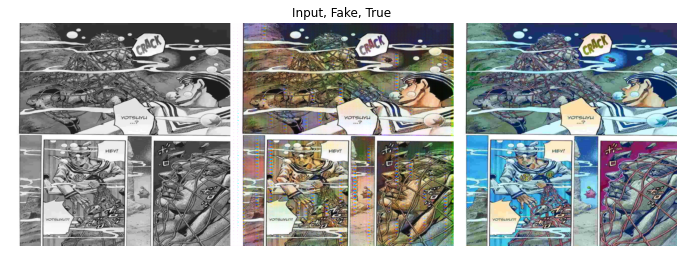

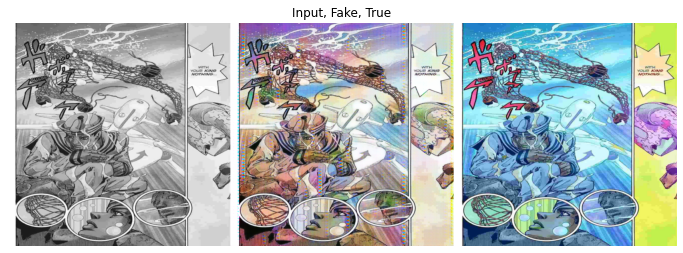

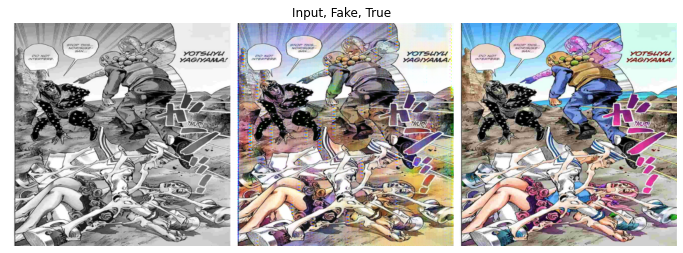

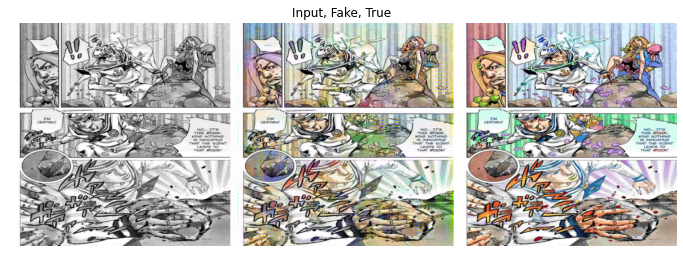

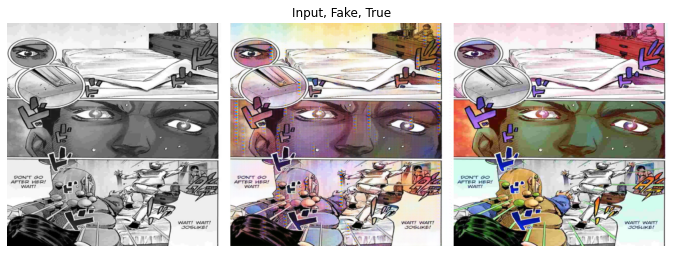

...

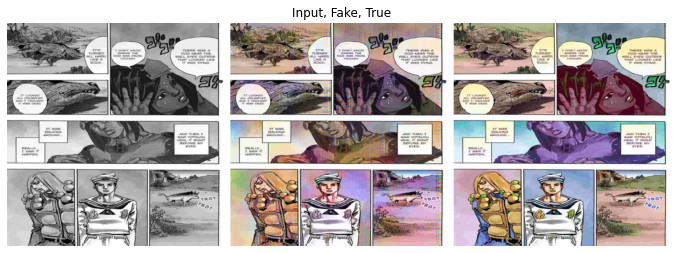

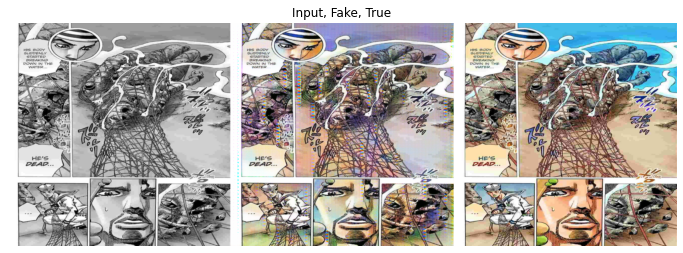

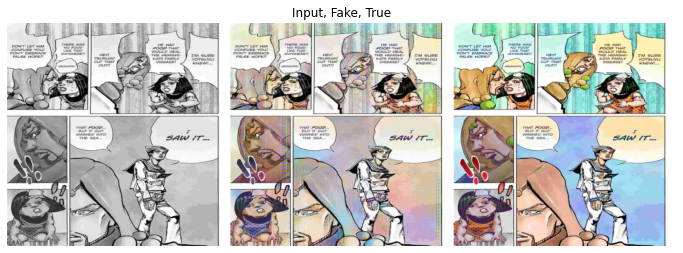

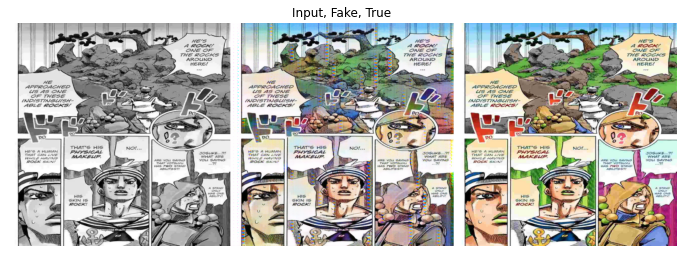

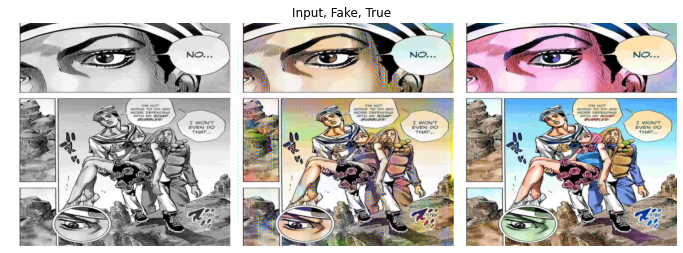

In [27]:
# Вывод
# По примерам качество раскраски получилось высоким, но не идеальным, так как
# каждая страница являается уникальной и не сложно вывести общую структуру. 
# Но если сравнивать с оригиналом, то стиль автора был сохранён, хоть цветовая
# гамма вышла другой.
# Для улучшения качества стоит увеличить кол-во картинок в train данных
# Еще можно воспользоваться функциями библиотеки opencv для последующей 
# обработки картинки, чтобы улучшить итоговое качество
[sample_prediction() for _ in range(50)];